# Import Libraries

In [3]:
import pandas as pd
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pio.templates.default = "plotly_white"

#### veri okuma ve yapısının incelenmesi

In [4]:
data = pd.read_csv("C:/Users/ŞEYDA/Desktop/supply_chain_data.csv")

In [5]:
print(data.head())

  Product type   SKU      Price  Availability  Number of products sold  \
0     haircare  SKU0  69.808006            55                      802   
1     skincare  SKU1  14.843523            95                      736   
2     haircare  SKU2  11.319683            34                        8   
3     skincare  SKU3  61.163343            68                       83   
4     skincare  SKU4   4.805496            26                      871   

   Revenue generated Customer demographics  Stock levels  Lead times  \
0        8661.996792            Non-binary            58           7   
1        7460.900065                Female            53          30   
2        9577.749626               Unknown             1          10   
3        7766.836426            Non-binary            23          13   
4        2686.505152            Non-binary             5           3   

   Order quantities  ...  Location Lead time  Production volumes  \
0                96  ...    Mumbai        29          

In [75]:
#data.info()
print(data["Routes"].unique().tolist())


['Route B', 'Route C', 'Route A']


In [5]:
#####100 veri var 24 column, 9 kategorik.

In [3]:
data.dtypes

Product type                object
SKU                         object
Price                      float64
Availability                 int64
Number of products sold      int64
Revenue generated          float64
Customer demographics       object
Stock levels                 int64
Lead times                   int64
Order quantities             int64
Shipping times               int64
Shipping carriers           object
Shipping costs             float64
Supplier name               object
Location                    object
Lead time                    int64
Production volumes           int64
Manufacturing lead time      int64
Manufacturing costs        float64
Inspection results          object
Defect rates               float64
Transportation modes        object
Routes                      object
Costs                      float64
dtype: object

In [7]:
####objectleri kategoriye çevirme.

In [4]:
import pandas as pd
kategorik_sutunlar = ["Product type","SKU","Customer demographics", "Shipping carriers", "Supplier name","Inspection results","Transportation modes","Routes","Location"]
data[kategorik_sutunlar] = data[kategorik_sutunlar].astype("category")

In [5]:
data.head()

,Product type,SKU,Price,Availability,Number of products sold,Revenue generated,Customer demographics,Stock levels,Lead times,Order quantities,...,Location,Lead time,Production volumes,Manufacturing lead time,Manufacturing costs,Inspection results,Defect rates,Transportation modes,Routes,Costs
0,haircare,SKU0,69.808006,55,802,8661.996792,Non-binary,58,7,96,...,Mumbai,29,215,29,46.279879,Pending,0.226410,Road,Route B,187.752075
1,skincare,SKU1,14.843523,95,736,7460.900065,Female,53,30,37,...,Mumbai,23,517,30,33.616769,Pending,4.854068,Road,Route B,503.065579
2,haircare,SKU2,11.319683,34,8,9577.749626,Unknown,1,10,88,...,Mumbai,12,971,27,30.688019,Pending,4.580593,Air,Route C,141.920282
3,skincare,SKU3,61.163343,68,83,7766.836426,Non-binary,23,13,59,...,Kolkata,24,937,18,35.624741,Fail,4.746649,Rail,Route A,254.776159
4,skincare,SKU4,4.805496,26,871,2686.505152,Non-binary,5,3,56,...,Delhi,5,414,3,92.065161,Fail,3.145580,Air,Route A,923.440632


#### Veriye ilk bakış


In [10]:
data.shape


(100, 24)

In [11]:
data.columns

Index(['Product type', 'SKU', 'Price', 'Availability',
       'Number of products sold', 'Revenue generated', 'Customer demographics',
       'Stock levels', 'Lead times', 'Order quantities', 'Shipping times',
       'Shipping carriers', 'Shipping costs', 'Supplier name', 'Location',
       'Lead time', 'Production volumes', 'Manufacturing lead time',
       'Manufacturing costs', 'Inspection results', 'Defect rates',
       'Transportation modes', 'Routes', 'Costs'],
      dtype='object')

In [12]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Price,100.0,49.462461,31.168193,1.699976,19.597823,51.239831,77.198228,99.171329
Availability,100.0,48.400000,30.743317,1.000000,22.750000,43.500000,75.000000,100.000000
Number of products sold,100.0,460.990000,303.780074,8.000000,184.250000,392.500000,704.250000,996.000000
Revenue generated,100.0,5776.048187,2732.841744,1061.618523,2812.847151,6006.352023,8253.976921,9866.465458
Stock levels,100.0,47.770000,31.369372,0.000000,16.750000,47.500000,73.000000,100.000000
Lead times,100.0,15.960000,8.785801,1.000000,8.000000,17.000000,24.000000,30.000000
Order quantities,100.0,49.220000,26.784429,1.000000,26.000000,52.000000,71.250000,96.000000
Shipping times,100.0,5.750000,2.724283,1.000000,3.750000,6.000000,8.000000,10.000000
Shipping costs,100.0,5.548149,2.651376,1.013487,3.540248,5.320534,7.601695,9.929816
Lead time,100.0,17.080000,8.846251,1.000000,10.000000,18.000000,25.000000,30.000000


In [13]:
#Stok Yönetimi : Stok seviyeleri minimum 0 (hiç stok yok!) 

#Üretim hacimleri yüksek, ve dengeli dağılım gösteriyor. lead time'ı ~14.77 gün, bu teslim sürelerini etkileyebilir.



In [14]:
### Hiç eksik değer var mı?
data.isnull().values.any()

np.False_

In [15]:
###eksik veri yok.Gösterelim.

In [16]:
data.isnull().sum()

Product type               0
SKU                        0
Price                      0
Availability               0
Number of products sold    0
Revenue generated          0
Customer demographics      0
Stock levels               0
Lead times                 0
Order quantities           0
Shipping times             0
Shipping carriers          0
Shipping costs             0
Supplier name              0
Location                   0
Lead time                  0
Production volumes         0
Manufacturing lead time    0
Manufacturing costs        0
Inspection results         0
Defect rates               0
Transportation modes       0
Routes                     0
Costs                      0
dtype: int64

In [8]:
cat_data= data.select_dtypes(include=["category"])

In [9]:
cat_data.head()

""
0
1
2
3
4


In [10]:
cat_data[["SKU",
          "Customer demographics",
          "Shipping carriers",
          "Supplier name",
          "Location",
          "Inspection results",
          "Transportation modes",
          "Routes"]].value_counts().count()



KeyError: "None of [Index(['SKU', 'Customer demographics', 'Shipping carriers', 'Supplier name',\n       'Location', 'Inspection results', 'Transportation modes', 'Routes'],\n      dtype='object')] are in the [columns]"

In [20]:
cols = [
    "SKU",
    "Customer demographics",
    "Shipping carriers",
    "Supplier name",
    "Location",
    "Inspection results",
    "Transportation modes",
    "Routes"
]

for c in cols:
    print("\n---", c, "---")
    print(cat_data[c].value_counts())


--- SKU ---
SKU
SKU0     1
SKU1     1
SKU10    1
SKU11    1
SKU12    1
        ..
SKU95    1
SKU96    1
SKU97    1
SKU98    1
SKU99    1
Name: count, Length: 100, dtype: int64

--- Customer demographics ---
Customer demographics
Unknown       31
Female        25
Non-binary    23
Male          21
Name: count, dtype: int64

--- Shipping carriers ---
Shipping carriers
Carrier B    43
Carrier C    29
Carrier A    28
Name: count, dtype: int64

--- Supplier name ---
Supplier name
Supplier 1    27
Supplier 2    22
Supplier 4    18
Supplier 5    18
Supplier 3    15
Name: count, dtype: int64

--- Location ---
Location
Kolkata      25
Mumbai       22
Chennai      20
Bangalore    18
Delhi        15
Name: count, dtype: int64

--- Inspection results ---
Inspection results
Pending    41
Fail       36
Pass       23
Name: count, dtype: int64

--- Transportation modes ---
Transportation modes
Road    29
Rail    28
Air     26
Sea     17
Name: count, dtype: int64

--- Routes ---
Routes
Route A    43
Rou

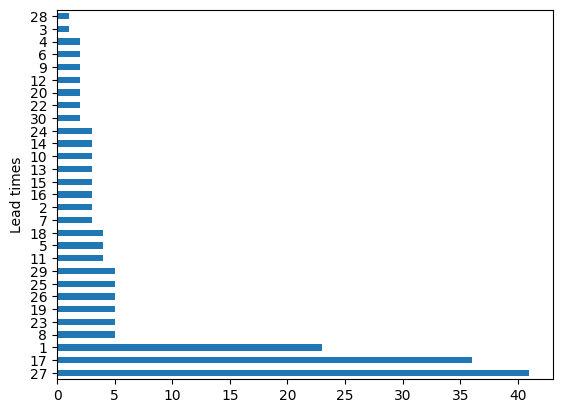

In [66]:
data["Inspection results"].value_counts().plot.barh();
data["Lead times"].value_counts().plot.barh();

In [22]:
data_num=data.select_dtypes(include=["Float64","Int64"])
data_num.head()

,Price,Availability,Number of products sold,Revenue generated,Stock levels,Lead times,Order quantities,Shipping times,Shipping costs,Lead time,Production volumes,Manufacturing lead time,Manufacturing costs,Defect rates,Costs
0,69.808006,55,802,8661.996792,58,7,96,4,2.956572,29,215,29,46.279879,0.226410,187.752075
1,14.843523,95,736,7460.900065,53,30,37,2,9.716575,23,517,30,33.616769,4.854068,503.065579
2,11.319683,34,8,9577.749626,1,10,88,2,8.054479,12,971,27,30.688019,4.580593,141.920282
3,61.163343,68,83,7766.836426,23,13,59,6,1.729569,24,937,18,35.624741,4.746649,254.776159
4,4.805496,26,871,2686.505152,5,3,56,8,3.890548,5,414,3,92.065161,3.145580,923.440632


####BARPLOT

In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 24 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   Product type             100 non-null    category
 1   SKU                      100 non-null    category
 2   Price                    100 non-null    float64 
 3   Availability             100 non-null    int64   
 4   Number of products sold  100 non-null    int64   
 5   Revenue generated        100 non-null    float64 
 6   Customer demographics    100 non-null    category
 7   Stock levels             100 non-null    int64   
 8   Lead times               100 non-null    int64   
 9   Order quantities         100 non-null    int64   
 10  Shipping times           100 non-null    int64   
 11  Shipping carriers        100 non-null    category
 12  Shipping costs           100 non-null    float64 
 13  Supplier name            100 non-null    category
 14  Location   

In [24]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Price,100.0,49.462461,31.168193,1.699976,19.597823,51.239831,77.198228,99.171329
Availability,100.0,48.400000,30.743317,1.000000,22.750000,43.500000,75.000000,100.000000
Number of products sold,100.0,460.990000,303.780074,8.000000,184.250000,392.500000,704.250000,996.000000
Revenue generated,100.0,5776.048187,2732.841744,1061.618523,2812.847151,6006.352023,8253.976921,9866.465458
Stock levels,100.0,47.770000,31.369372,0.000000,16.750000,47.500000,73.000000,100.000000
Lead times,100.0,15.960000,8.785801,1.000000,8.000000,17.000000,24.000000,30.000000
Order quantities,100.0,49.220000,26.784429,1.000000,26.000000,52.000000,71.250000,96.000000
Shipping times,100.0,5.750000,2.724283,1.000000,3.750000,6.000000,8.000000,10.000000
Shipping costs,100.0,5.548149,2.651376,1.013487,3.540248,5.320534,7.601695,9.929816
Lead time,100.0,17.080000,8.846251,1.000000,10.000000,18.000000,25.000000,30.000000


In [67]:
data["Inspection results"].head()
data["Lead times"].head()

0     7
1    30
2    10
3    13
4     3
Name: Lead times, dtype: int64

In [2]:
from pandas.api.types import CategoricalDtype


In [27]:
data["Inspection results"]=data["Inspection results"].astype(CategoricalDtype(ordered=True))


In [28]:
data["Inspection results"].head()

0    Pending
1    Pending
2    Pending
3       Fail
4       Fail
Name: Inspection results, dtype: category
Categories (3, object): ['Fail' < 'Pass' < 'Pending']

In [29]:
Inspection_results = ["Fail", "Pending", "Pass"]

In [30]:
cat_type = CategoricalDtype(categories=Inspection_results, ordered=True)
data["Inspection results"] = data["Inspection results"].astype(cat_type)

In [31]:
data["Inspection results"].dtype

CategoricalDtype(categories=['Fail', 'Pending', 'Pass'], ordered=True, categories_dtype=object)

In [32]:
data.dtypes

Product type               category
SKU                        category
Price                       float64
Availability                  int64
Number of products sold       int64
Revenue generated           float64
Customer demographics      category
Stock levels                  int64
Lead times                    int64
Order quantities              int64
Shipping times                int64
Shipping carriers          category
Shipping costs              float64
Supplier name              category
Location                   category
Lead time                     int64
Production volumes            int64
Manufacturing lead time       int64
Manufacturing costs         float64
Inspection results         category
Defect rates                float64
Transportation modes       category
Routes                     category
Costs                       float64
dtype: object

BARPLOT

Text(0.5, 1.0, 'Inspection results sonuç frekansları')

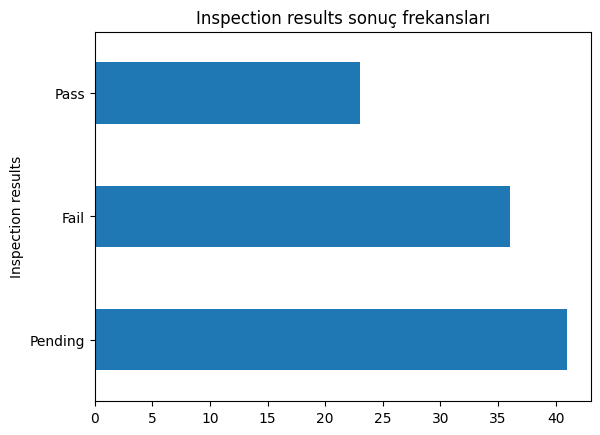

In [33]:
(data["Inspection results"]
.value_counts()
.plot.barh()
.set_title("Inspection results sonuç frekansları"))

ÇAPRAZLAMALAR

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt 

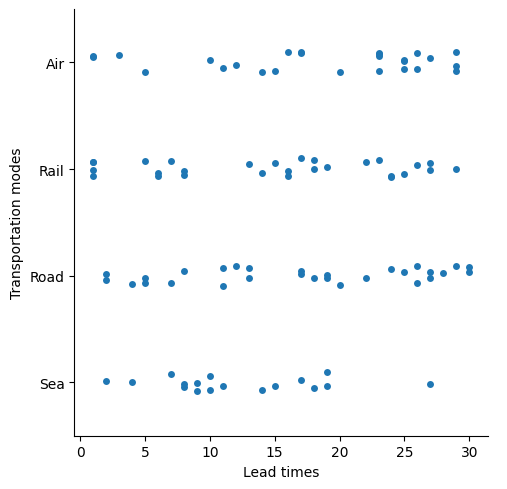

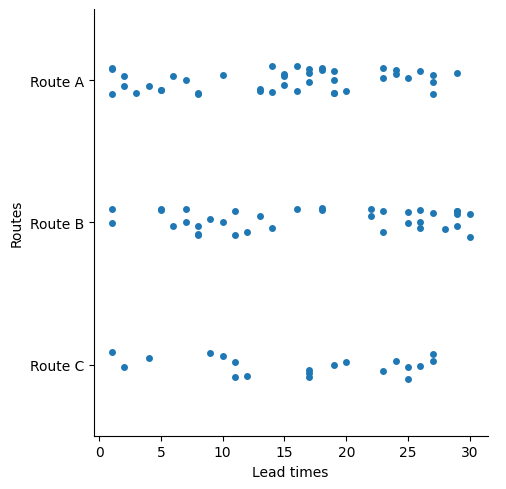

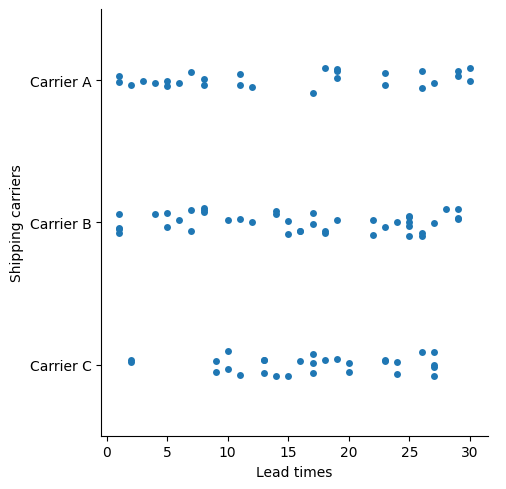

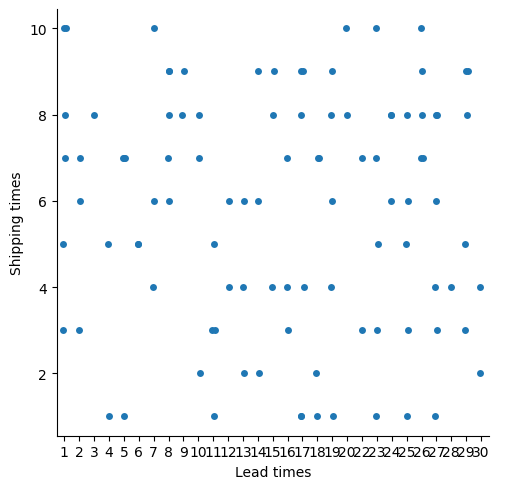

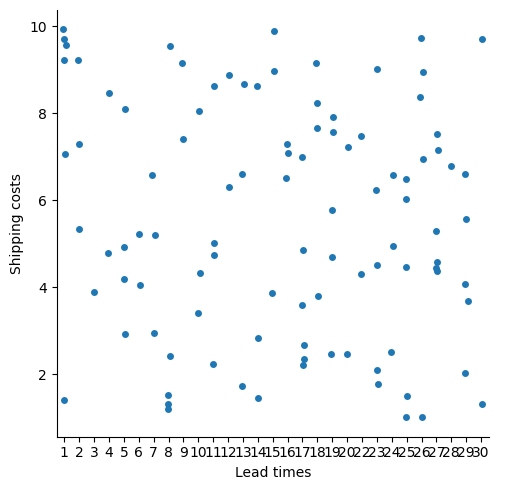

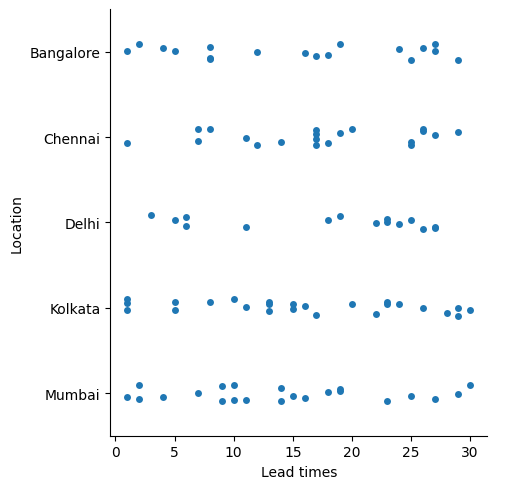

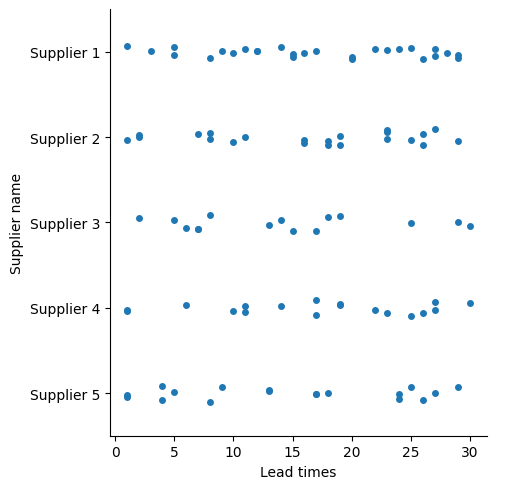

In [9]:
"""sns.catplot(x= "Inspection results", y= "Defect rates", data=data)
sns.catplot(x= "Inspection results", y= "Price", data=data)
sns.catplot(x= "Inspection results", y= "Lead times", data=data)
sns.catplot(x= "Inspection results", y= "Manufacturing lead time", data=data)
sns.catplot(x= "Inspection results", y= "Production volumes", data=data)
sns.catplot(x= "Inspection results", y= "Product type", data=data)"""
#sns.catplot(x= "Lead times", y= "Inspection results", data=data)
sns.catplot(x= "Lead times", y= "Transportation modes", data=data)
sns.catplot(x= "Lead times", y= "Routes", data=data)
sns.catplot(x= "Lead times", y= "Shipping carriers", data=data)
sns.catplot(x= "Lead times", y= "Shipping times", data=data)
sns.catplot(x= "Lead times", y= "Shipping costs", data=data)
sns.catplot(x= "Lead times", y= "Location", data=data)
sns.catplot(x= "Lead times", y= "Supplier name", data=data)


<Axes: xlabel='Inspection results', ylabel='Defect rates'>

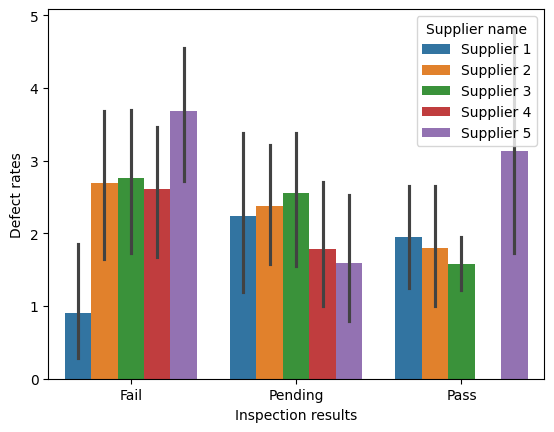

In [36]:
#sns.barplot(x="Inspection results",y= "Defect rates",hue="Product type", data=data)
sns.barplot(x="Inspection results",y= "Defect rates",hue="Supplier name", data=data)


In [37]:
#Supplier 1 de kalite iyi.
#Supplier 5 de kalite kötü.
#Supplier 3 de pass az.

In [38]:
data.groupby(["Inspection results", "Supplier name"])["Defect rates"].mean()

C:\Users\ŞEYDA\AppData\Local\Temp\ipykernel_14144\3357675121.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  data.groupby(["Inspection results", "Supplier name"])["Defect rates"].mean()


Inspection results  Supplier name
Fail                Supplier 1       0.907174
                    Supplier 2       2.693933
                    Supplier 3       2.757925
                    Supplier 4       2.616783
                    Supplier 5       3.689315
Pending             Supplier 1       2.241117
                    Supplier 2       2.379898
                    Supplier 3       2.554760
                    Supplier 4       1.778627
                    Supplier 5       1.594445
Pass                Supplier 1       1.948156
                    Supplier 2       1.801993
                    Supplier 3       1.582709
                    Supplier 4            NaN
                    Supplier 5       3.132195
Name: Defect rates, dtype: float64

In [39]:
data.groupby(["Inspection results", "Product type"])["Defect rates"].mean()

C:\Users\ŞEYDA\AppData\Local\Temp\ipykernel_14144\2917886259.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  data.groupby(["Inspection results", "Product type"])["Defect rates"].mean()


Inspection results  Product type
Fail                cosmetics       2.188127
                    haircare        2.529315
                    skincare        2.902501
Pending             cosmetics       1.710409
                    haircare        2.266609
                    skincare        2.326231
Pass                cosmetics       1.819351
                    haircare        2.924478
                    skincare        1.675910
Name: Defect rates, dtype: float64

In [40]:
##HİSTOGRAM

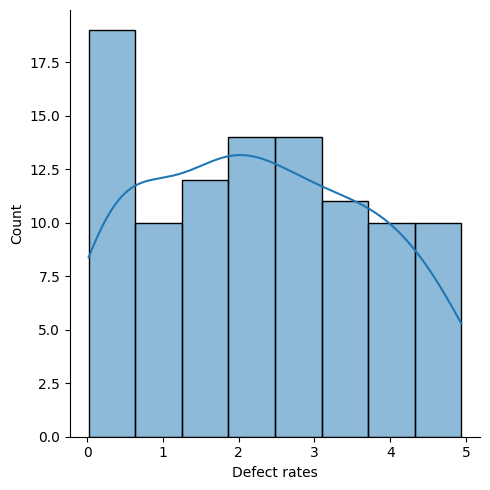

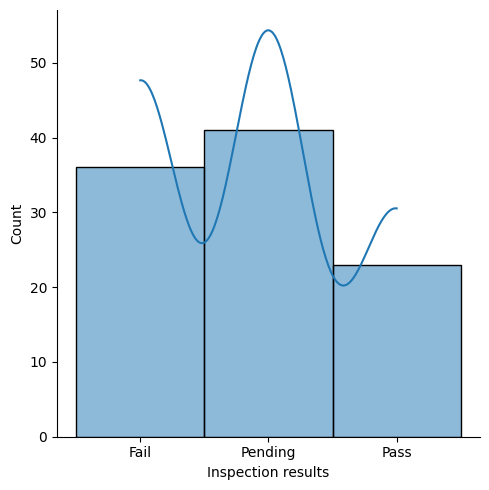

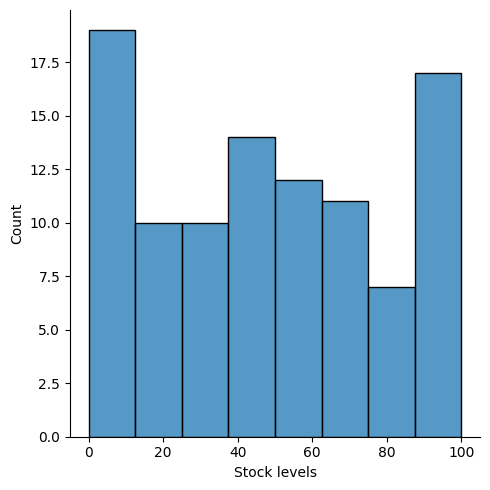

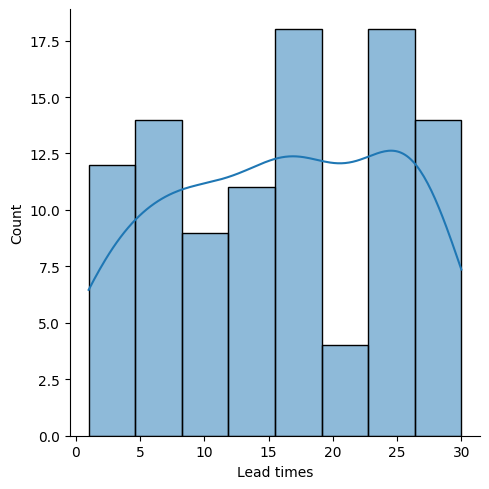

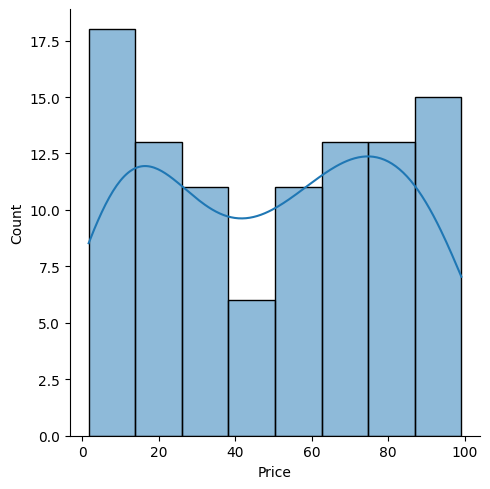

In [41]:
sns.displot(data["Defect rates"], kde = True) #kde yogunluk  
sns.displot(data["Inspection results"], kde = True) 
sns.displot(data["Stock levels"], kde = False) 
sns.displot(data["Lead times"], kde = True) 
sns.displot(data["Price"], kde = True) 

In [42]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Price,100.0,49.462461,31.168193,1.699976,19.597823,51.239831,77.198228,99.171329
Availability,100.0,48.400000,30.743317,1.000000,22.750000,43.500000,75.000000,100.000000
Number of products sold,100.0,460.990000,303.780074,8.000000,184.250000,392.500000,704.250000,996.000000
Revenue generated,100.0,5776.048187,2732.841744,1061.618523,2812.847151,6006.352023,8253.976921,9866.465458
Stock levels,100.0,47.770000,31.369372,0.000000,16.750000,47.500000,73.000000,100.000000
Lead times,100.0,15.960000,8.785801,1.000000,8.000000,17.000000,24.000000,30.000000
Order quantities,100.0,49.220000,26.784429,1.000000,26.000000,52.000000,71.250000,96.000000
Shipping times,100.0,5.750000,2.724283,1.000000,3.750000,6.000000,8.000000,10.000000
Shipping costs,100.0,5.548149,2.651376,1.013487,3.540248,5.320534,7.601695,9.929816
Lead time,100.0,17.080000,8.846251,1.000000,10.000000,18.000000,25.000000,30.000000


c:\Users\ŞEYDA\AppData\Local\Programs\Python\Python312\Lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(*plot_args, **plot_kwargs)
c:\Users\ŞEYDA\AppData\Local\Programs\Python\Python312\Lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(*plot_args, **plot_kwargs)
c:\Users\ŞEYDA\AppData\Local\Programs\Python\Python312\Lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(*plot_args, **plot_kwargs)
c:\Users\ŞEYDA\AppData\Local\Programs\Python\Python312\Lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

`shade` is now deprec

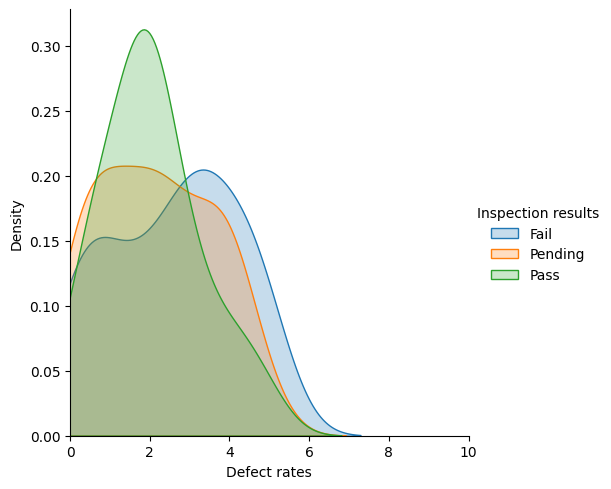

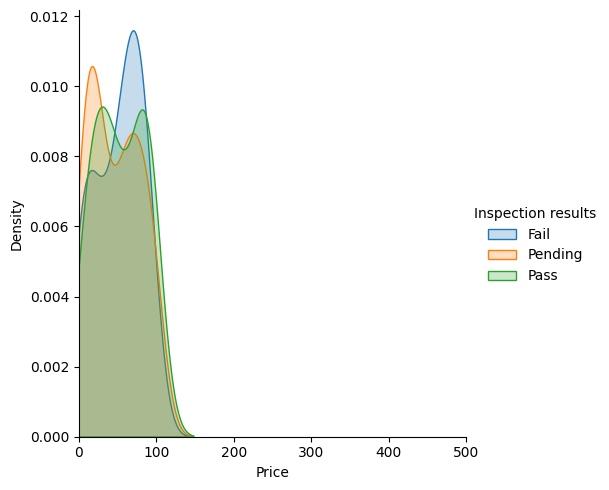

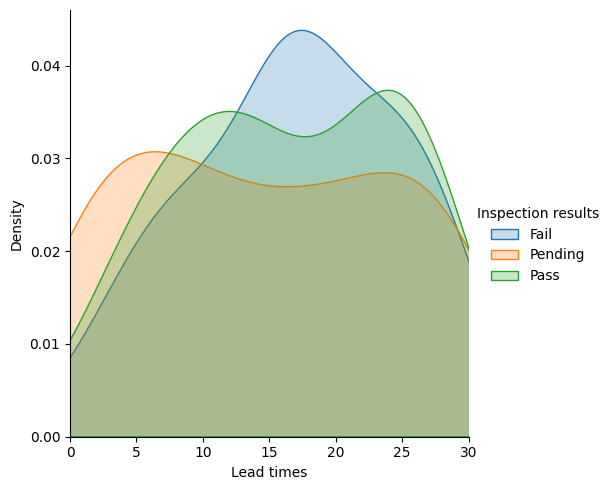

In [43]:
(sns
 .FacetGrid(data,
               hue="Inspection results",
               height=5,
               xlim=(0,10))
 .map(sns.kdeplot,"Defect rates",shade=True)
.add_legend()
);
(sns
 .FacetGrid(data,
               hue="Inspection results",
               height=5,
               xlim=(0,500))
 .map(sns.kdeplot,"Price",shade=True)
.add_legend()
);
(sns
 .FacetGrid(data,
               hue="Inspection results",
               height=5,
               xlim=(0,30))
 .map(sns.kdeplot,"Lead times",shade=True)
.add_legend()
);

In [44]:
# pass 40 70 arası fiyatlarda orta fiyatlı urunelrde olmuş
#fail 70 100 arası ürünlerde olmuş Ynai urun fiyat arttıkca kalite düşmüş. Üretim fire arttıkça maliyet artar


In [45]:
###BOXPLOT

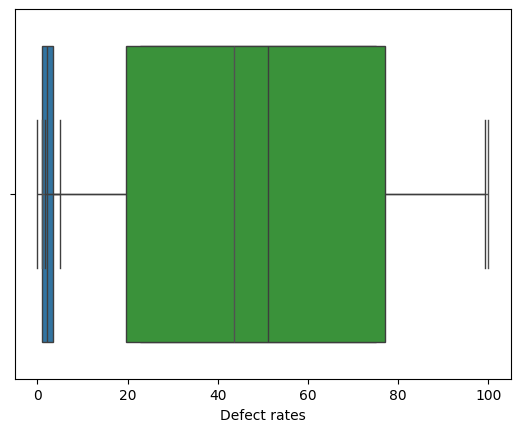

In [46]:
sns.boxplot(x=data["Defect rates"]);
sns.boxplot(x=data["Availability"]);
sns.boxplot(x=data["Price"]);

<Axes: xlabel='Supplier name', ylabel='Costs'>

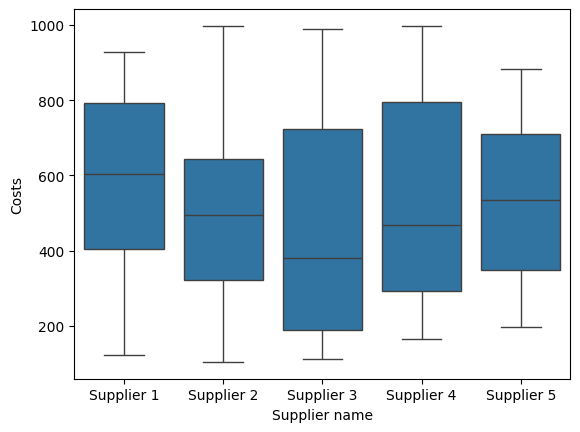

In [47]:
sns.boxplot(x="Supplier name",y="Costs",data=data)
#sns.boxplot(x="Shipping carriers",y="Lead times",data=data)

<Axes: xlabel='Inspection results', ylabel='Lead times'>

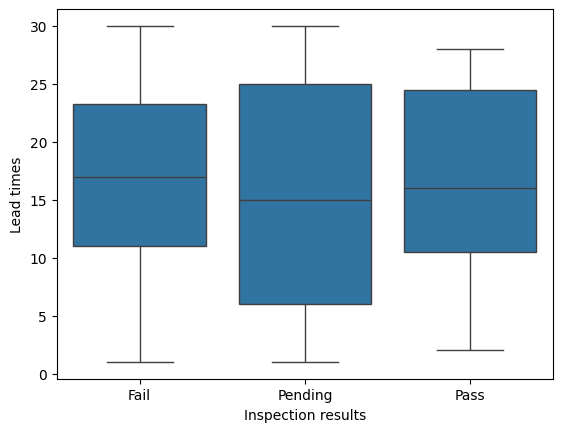

In [48]:
sns.boxplot(x="Inspection results",y="Lead times",data=data)

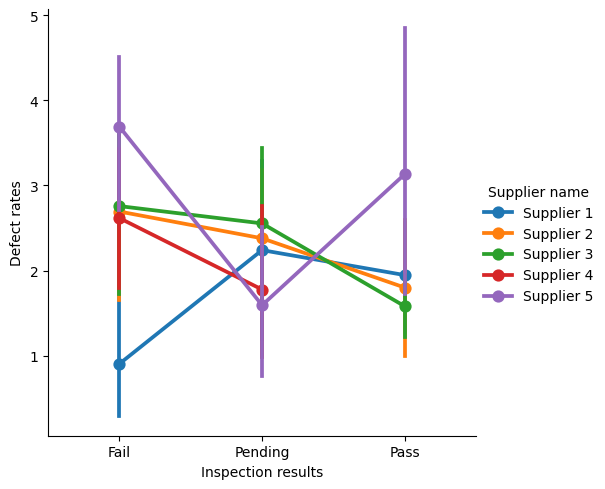

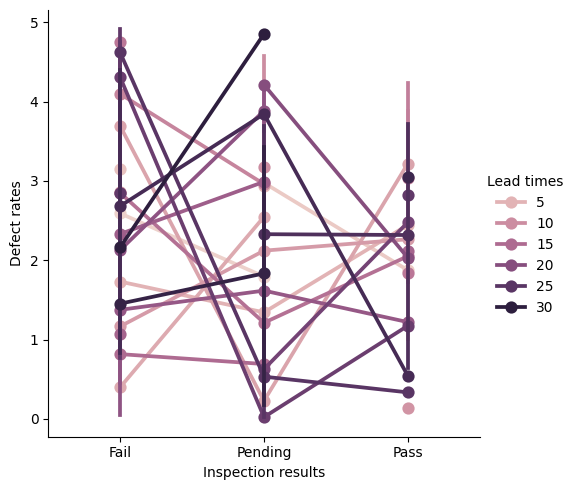

In [49]:
sns.catplot(data,x="Inspection results",y="Defect rates",hue="Supplier name", kind="point") 
sns.catplot(data,x="Inspection results",y="Defect rates",hue="Lead times", kind="point") 

In [50]:
###KORELASYON

<Axes: xlabel='Defect rates', ylabel='Lead times'>

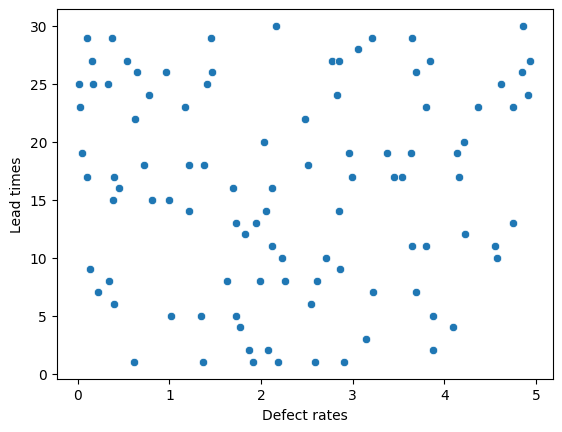

In [51]:
sns.scatterplot(x="Defect rates",y="Lead times",data=data)



<Axes: xlabel='Defect rates', ylabel='Lead time'>

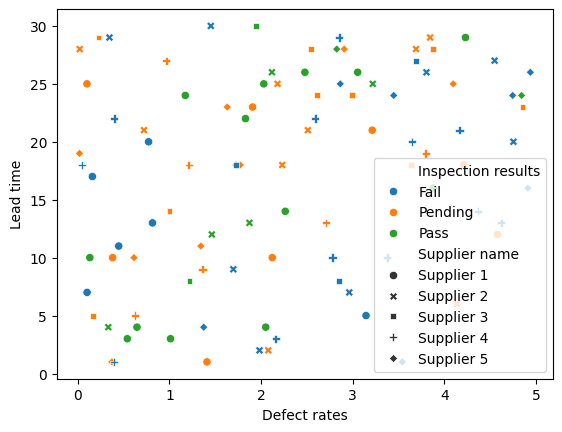

In [52]:
#sns.scatterplot(x="Defect rates",y="Lead times",hue="Inspection results",data=data)
sns.scatterplot(x="Defect rates",y="Lead time",hue="Inspection results",style="Supplier name",data=data)


<Axes: xlabel='Defect rates', ylabel='Lead time'>

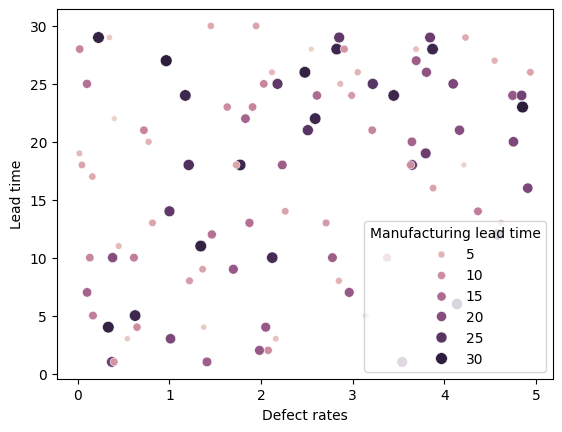

In [53]:
sns.scatterplot(x="Defect rates",y="Lead time", hue="Manufacturing lead time",size="Manufacturing lead time",data=data)

In [54]:
import seaborn as sns
import matplotlib.pyplot as plt


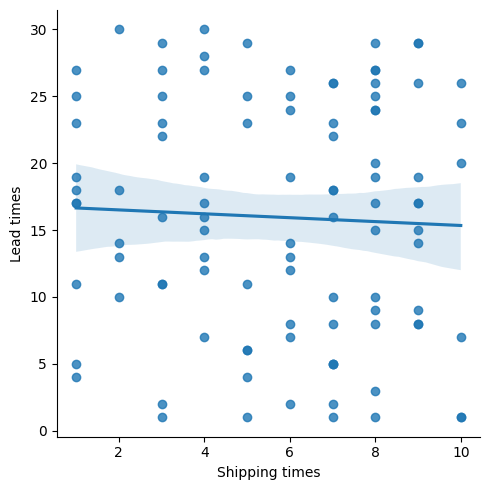

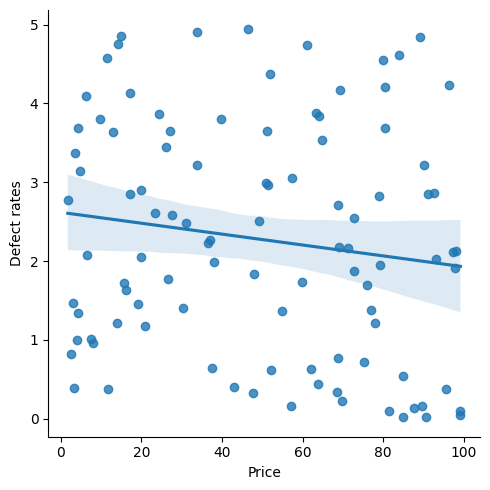

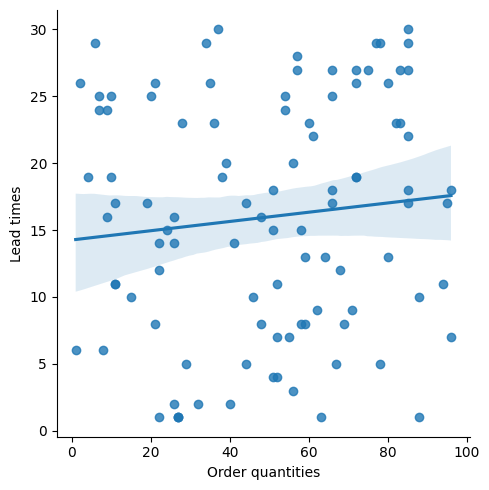

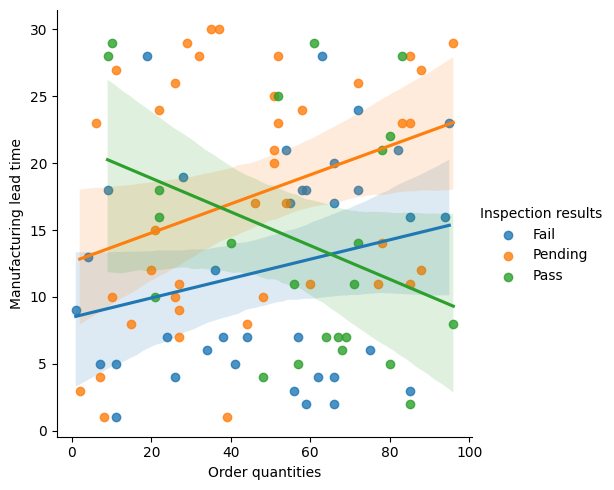

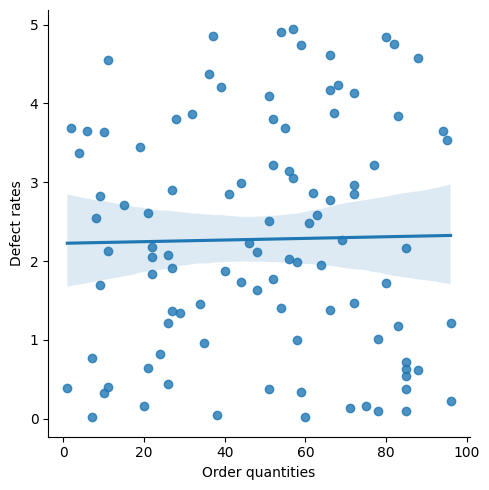

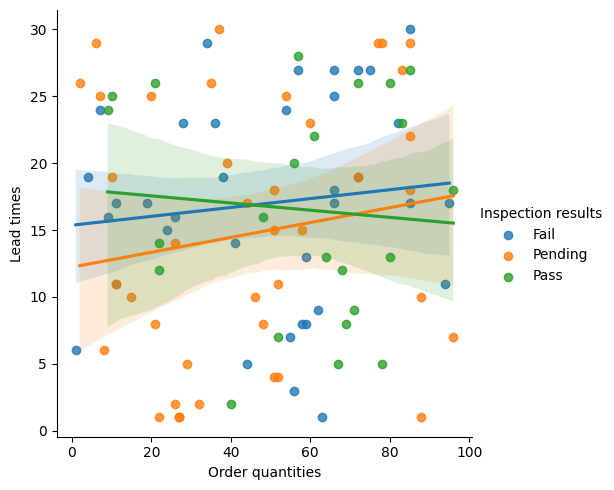

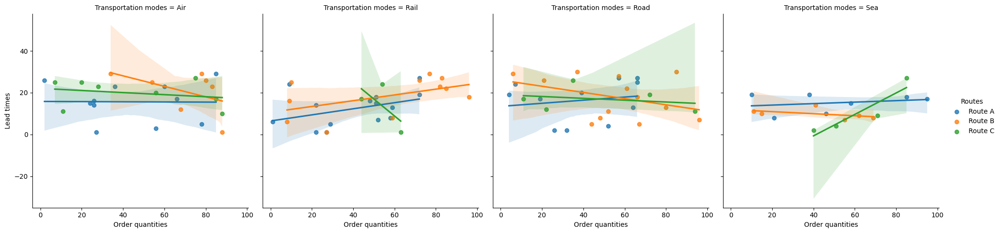

In [55]:
sns.lmplot(x="Shipping times", y="Lead times", data=data)
sns.lmplot(x="Price", y="Defect rates", data=data)
sns.lmplot(x="Order quantities", y="Lead times", data=data)
sns.lmplot(x="Order quantities", y="Manufacturing lead time",hue="Inspection results" ,data=data)
sns.lmplot(x="Order quantities", y="Defect rates", data=data)
sns.lmplot(x="Order quantities", y="Lead times", hue="Inspection results",data=data)
sns.lmplot(x="Order quantities", y="Lead times", hue="Routes",col= "Transportation modes",data=data)

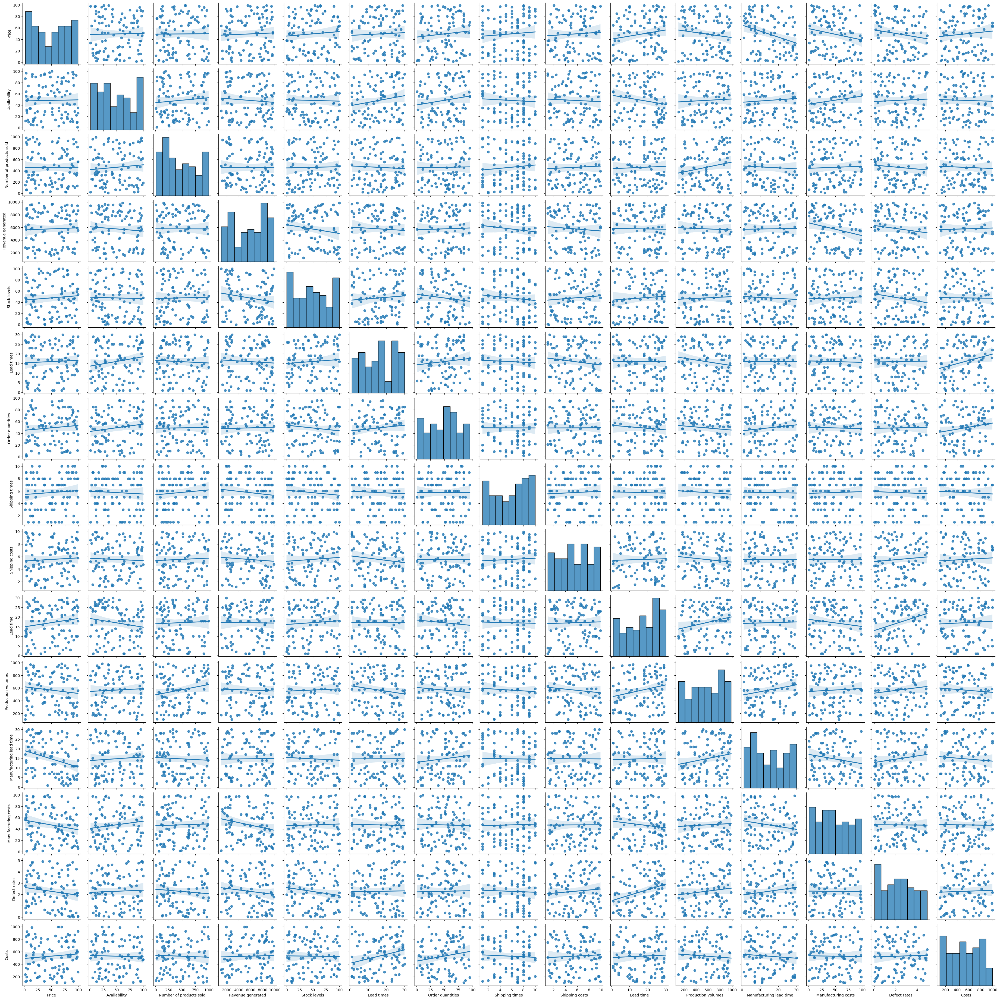

In [56]:
sns.pairplot(data, kind='reg');

In [57]:
#lead times ile costs arasında iyi lineerlik var.
#Lead time. Production volumes, Price ve defect rates ilişki var.
#Production volumes number o f product sold ve lead time manufacturing lead time
#defect rates ve lead time 
#costs lead times, order quantities, arasında ilişki var.

#Manufacturing costs arttıkca revenue g. azaliyor
#price arttıkca manufacturing lead time,manufacturing costs da azalıyor.
#

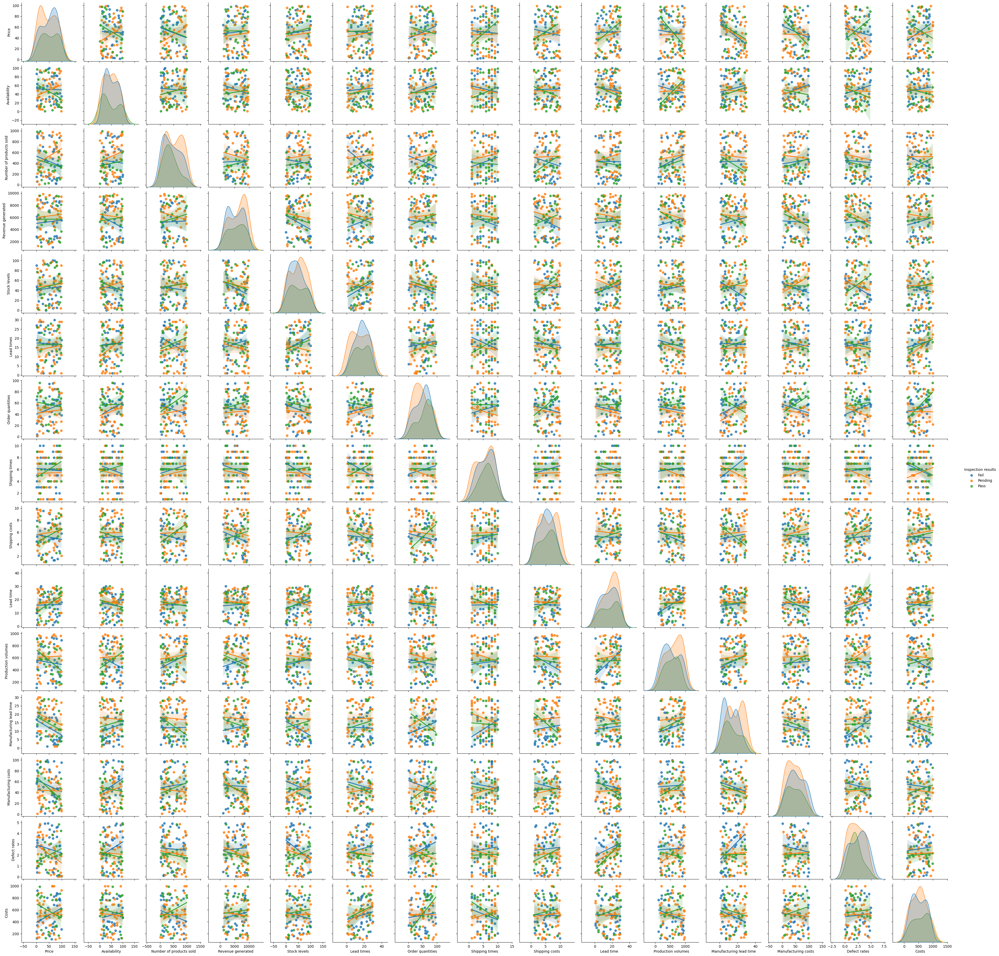

In [58]:
sns.pairplot(data, hue= "Inspection results",kind='reg');

#Defect rates ve faillik arttıkca availability, order quanitites , lead time,manufacutirng lead time artıoyr.

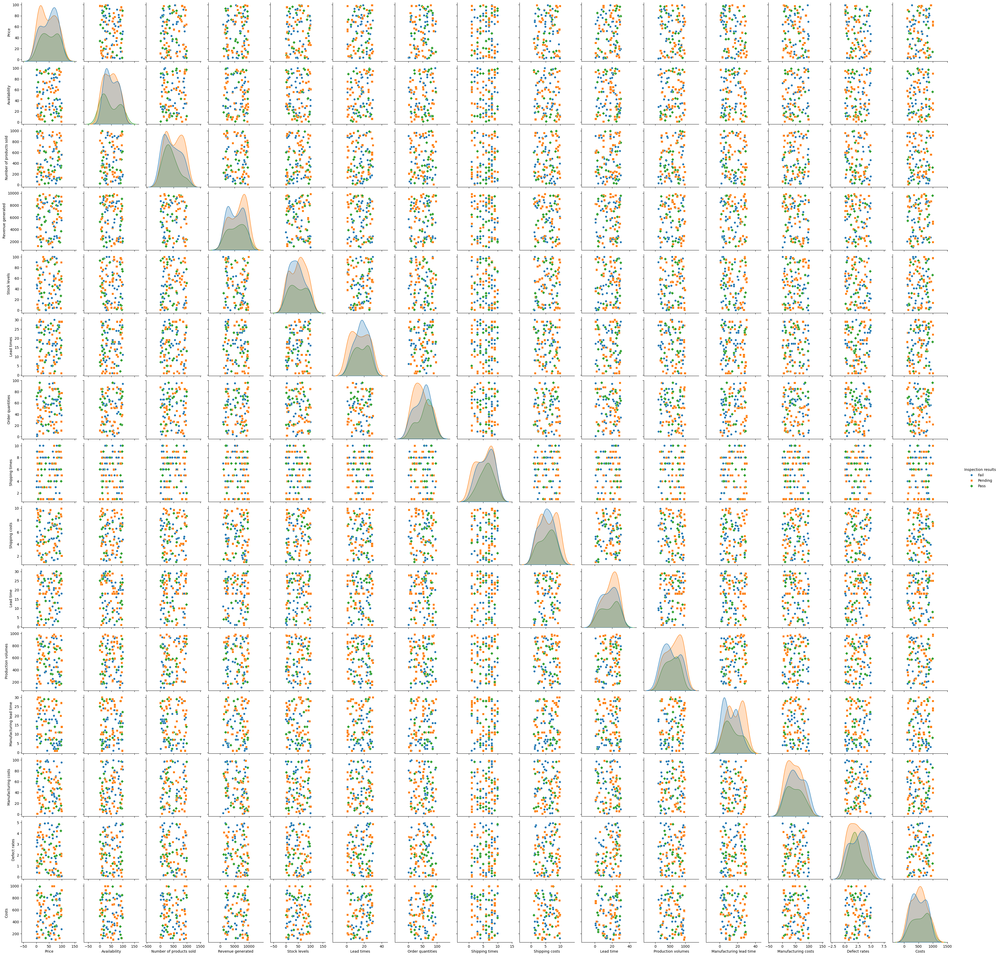

In [59]:
sns.pairplot(data, hue= "Inspection results",markers=["o","s","D"])

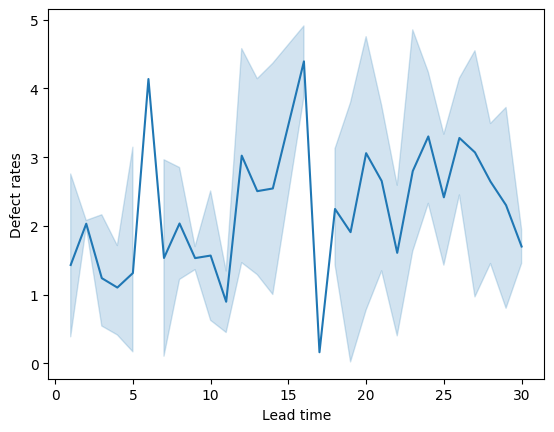

In [60]:
sns.lineplot(x="Lead time", y="Defect rates", data=data);


In [61]:
pip install pandas_datareader

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [62]:
import pandas_datareader as pr